In [1]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

import pandas as pd 
import numpy as np
import glob
from tqdm import tqdm
import cv2
from sklearn.model_selection import train_test_split
!pip install fiona
import fiona
!pip install segmentation_models_pytorch
import segmentation_models_pytorch as smp

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset
from torchvision import datasets, models 
from torchvision.models import resnet18
from torchvision.utils import draw_segmentation_masks
from torchvision import transforms as T

from PIL import Image
import matplotlib.pyplot as plt
from IPython.display import clear_output

import warnings
warnings.filterwarnings("ignore")

import json
import os

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 97.9/97.9 kB 997.8 kB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.8/58.8 kB 2.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 377.0/377.0 kB 3.0 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... - done
  Created wheel for efficientnet-pytorch: filename=efficientnet_pytorch-0.7.1-py3-none-any.whl size=16446 sha256=9859230060e69bccccec6056aa9f68d134ddc19ed04f871f9bb39b17d6d956d5
  Stored in directory: /root/.cache/pip/wheels/0e/cc/b2/49e74588263573ff778da58cc99b9c6349b496636a7e165be6
  Created wheel for pretrainedmodels: filename=pretrainedmodels-0.7.4-py3-none-any.whl size=60965 sha256=122ffda4c376d8f45441052944ddb2c063f127f1a2fc98fdef88935879652ed1
  Stored in directory: /root/.cache/pip/wheels/ed/27/e8/9543d42de2740d3544db96aefef63bda3f2c1761b3334f4873
Successfully built efficientnet-pytorch pretrainedmodels


## Датасет

Прежде чем разбираться с моделями, нам надо в первую очередь разобраться с тем, как грузить датасет. Давайте напишем класс в торче для этого.

(-0.5, 1623.5, 1231.5, -0.5)

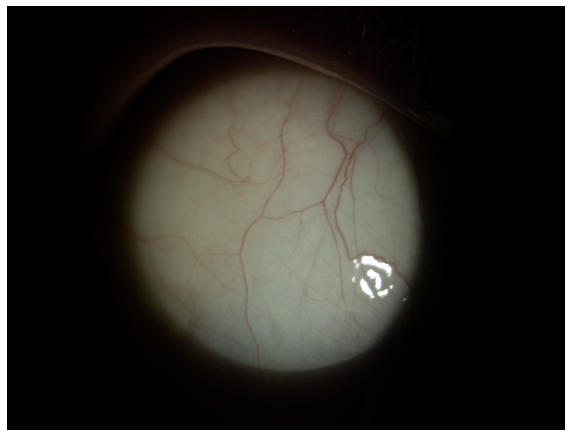

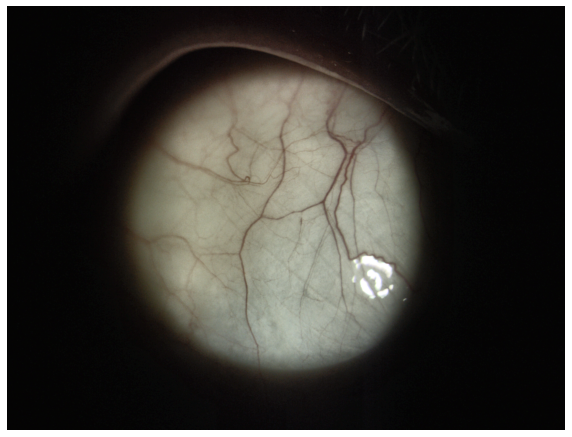

In [2]:
'''
LAB color space expresses color variations across three channels. One channel for brightness and two channels for color:

L-channel: representing lightness in the image
a-channel: representing change in color between red and green
b-channel: representing change in color between yellow and blue
In the following I perform adaptive histogram equalization on the L-channel 
and convert the resulting image back to BGR color space. This enhances the brightness while also limiting contrast sensitivity. 

'''

def incrase_contrast(img):
    
    # converting to LAB color space
    lab= cv2.cvtColor(img, cv2.COLOR_BGR2LAB)
    
    l_channel, a, b = cv2.split(lab)

    # Applying CLAHE to L-channel
    # feel free to try different values for the limit and grid size:
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
    cl = clahe.apply(l_channel)

    # merge the CLAHE enhanced L-channel with the a and b channel
    limg = cv2.merge((cl,a,b))

    # Converting image from LAB Color model to BGR color spcae
    enhanced_img = cv2.cvtColor(limg, cv2.COLOR_LAB2BGR)

    # Stacking the original image with the enhanced image
    #result = np.hstack((img, enhanced_img))
    
    return enhanced_img

image = cv2.imread("../input/dig-bf2022-train/1.png", cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")
image = incrase_contrast(image)
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")

(-0.5, 1623.5, 1231.5, -0.5)

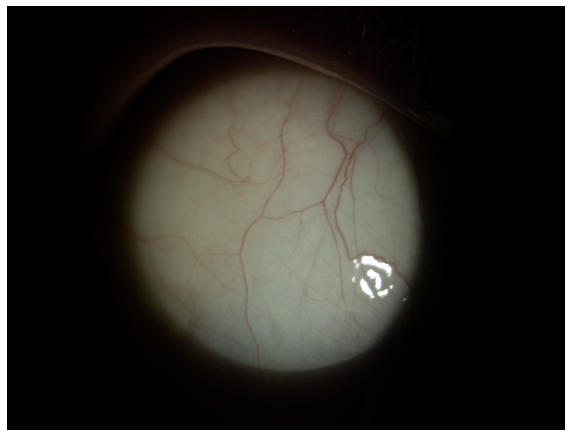

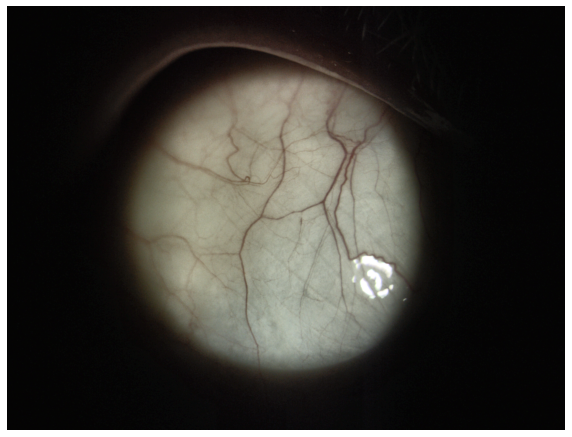

In [3]:
clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8,8))
#cl1 = clahe.apply(img)

image = cv2.imread("../input/dig-bf2022-train/1.png", cv2.IMREAD_COLOR)
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")

lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
lab_planes = list(cv2.split(lab))
clahe = cv2.createCLAHE(clipLimit=2.0,tileGridSize=(8,8))
lab_planes[0] = clahe.apply(lab_planes[0])
lab = cv2.merge(lab_planes)

image = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)

plt.figure(figsize=(10, 10))
plt.imshow(image)
plt.axis("off")

In [4]:
class EyeDataset(Dataset):
    """
    Класс датасета, организующий загрузку и получение изображений и соответствующих разметок
    """

    def __init__(self, data_folder: str, transform = None, is_test = False, aug = None,):
        self.class_ids = {"vessel": 1}

        self.data_folder = data_folder
        self.transform = transform
        self._image_files = glob.glob(f"{data_folder}/*.png")
        self.is_test = is_test
        self.aug = aug
        
    def del_imges_without_mask(self):
        cnt_images_without_masks = [len(glob.glob(filepath.replace("png", "geojson"))) for filepath in self._image_files]

        self._image_files = [ item if cnt_images_without_masks[i] == 1 else "" for i, item in enumerate(dataset._image_files)]
        while "" in self._image_files:
            self._image_files.remove("")
        

    @staticmethod
    def read_image(path: str) -> np.ndarray:
        image = cv2.imread(str(path), cv2.IMREAD_COLOR)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        #
        #image = incrase_contrast(image)
        #image = np.array(image / 255, dtype=np.float32)
        return image

    @staticmethod
    def parse_polygon(coordinates: dict, image_size: tuple) -> np.ndarray:
        mask = np.zeros(image_size, dtype=np.float32)
        if len(coordinates) == 1:
            points = [np.int32(coordinates)]
            cv2.fillPoly(mask, points, 1)
        else:
            fill_color = 1
            for polygon in coordinates:
                points = [np.int32([polygon])]
                cv2.fillPoly(mask, points, fill_color)
                if fill_color == 1: fill_color = 0
        return mask

    @staticmethod
    def parse_mask(shape: dict, image_size: tuple) -> np.ndarray:
        """
        Метод для парсинга фигур из geojson файла
        """
        mask = np.zeros(image_size, dtype=np.float32)
        coordinates = shape['coordinates']
        
        if shape['type'] == 'MultiPolygon':
            for polygon in coordinates:
                mask += EyeDataset.parse_polygon(polygon, image_size)
        else:
            mask += EyeDataset.parse_polygon(coordinates, image_size)

        return mask

    def read_layout(self, path: str, image_size: tuple) -> np.ndarray:
        """
        Метод для чтения geojson разметки и перевода в numpy маску
        """
        with open(path, 'r', encoding='cp1251') as f:  # some files contain cyrillic letters, thus cp1251
            json_contents = json.load(f)

        num_channels = 1 + max(self.class_ids.values())
        mask_channels = [np.zeros(image_size, dtype=np.float32) for _ in range(num_channels)]
        mask = np.zeros(image_size, dtype=np.float32)

        if type(json_contents) == dict and json_contents['type'] == 'FeatureCollection':
            features = json_contents['features']
        elif type(json_contents) == list:
            features = json_contents
        else:
            features = [json_contents]

        for shape in features:
            channel_id = self.class_ids["vessel"]
            mask = self.parse_mask(shape['geometry'], image_size)
            mask_channels[channel_id] = np.maximum(mask_channels[channel_id], mask)

        mask_channels[0] = 1 - np.max(mask_channels[1:], axis=0)

        return np.stack(mask_channels, axis=-1)

    def __getitem__(self, idx: int) -> dict:
        # Достаём имя файла по индексу
        image_path = self._image_files[idx]

        # Получаем соответствующий файл разметки
        if self.is_test:
            # Заглушка для теста
            json_path = "../input/dig-bf2022-train/1.geojson"
        else:
            json_path = image_path.replace("png", "geojson")

        image = self.read_image(image_path)

        mask = self.read_layout(json_path, image.shape[:2])

        sample = {'image': image,
                  'mask': mask}

        if self.transform is not None:
            sample = self.transform(**sample)
        
        #if self.aug is not None:
        #    sample = self.aug(image=sample['image'], mask=sample['mask'])

        return sample

    def __len__(self):
        return len(self._image_files)

    # Метод для проверки состояния датасета
    def make_report(self):
        reports = []
        if (not self.data_folder):
            reports.append("Путь к датасету не указан")
        if (len(self._image_files) == 0):
            reports.append("Изображения для распознавания не найдены")
        else:
            reports.append(f"Найдено {len(self._image_files)} изображений")
        cnt_images_without_masks = sum([1 - len(glob.glob(filepath.replace("png", "geojson"))) for filepath in self._image_files])
        if cnt_images_without_masks > 0:
            reports.append(f"Найдено {cnt_images_without_masks} изображений без разметки")
        else:
            reports.append(f"Для всех изображений есть файл разметки")
        return reports


class DatasetPart(Dataset):
    """
    Обертка над классом датасета для его разбиения на части
    """
    def __init__(self, dataset: Dataset,
                 indices: np.ndarray,
                 transform: A.Compose = None):
        self.dataset = dataset
        self.indices = indices

        self.transform = transform

    def __getitem__(self, idx: int) -> dict:
        sample = self.dataset[self.indices[idx]]

        if self.transform is not None:
            sample = self.transform(**sample)

        return sample

    def __len__(self) -> int:
        return len(self.indices)


12


(-0.5, 1623.5, 1231.5, -0.5)

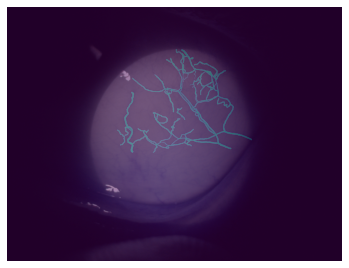

In [5]:
# Poligon repairing

import math
n = 5
def parse_polygon_2(coordinates: dict, image_size: tuple) -> np.ndarray:
        mask = np.zeros(image_size, dtype=np.float32)
        #print(len(coordinates))
        if len(coordinates) == 1:
            points = [np.int32(coordinates)]
            cv2.fillPoly(mask, points, 1)
        else:
            fill = 1
            for polygon in coordinates:
                #print(len(polygon))
                points = [np.int32([polygon])] #
                cv2.fillPoly(mask, points, fill)
                if (fill == 1): fill = 0
                #else: fill = 1
                #break
        return mask


img = cv2.imread(f"../input/dig-bf2022-train/{n}.png", cv2.IMREAD_COLOR)
#plt.imshow(img)
#img.shape
image_size = (1232, 1624)
with open(f"../input/dig-bf2022-train/{n}.geojson", 'r', encoding='cp1251') as f:  # some files contain cyrillic letters, thus cp1251
    json_contents = json.load(f)

    num_channels = 2#1 + max(self.class_ids.values())
    mask_channels = [np.zeros(image_size, dtype=np.float32) for _ in range(num_channels)]
    mask = np.zeros(image_size, dtype=np.float32)

if type(json_contents) == dict and json_contents['type'] == 'FeatureCollection':
    features = json_contents['features']
elif type(json_contents) == list:
    features = json_contents
else:
    features = [json_contents]
#features

print(len(features))
for shape in features:#[11:12]:
    channel_id = 1
    
    if True:  #mask = self.parse_mask(shape['geometry'], image_size)
        shape = shape['geometry']
        mask = np.zeros(image_size, dtype=np.float32)
        coordinates = shape['coordinates']
        #print(len(coordinates))
        #for item in coordinates[0][0][:5]: print(item)
        #print(shape['type'])
        
        if shape['type'] == 'MultiPolygon':
            for polygon in coordinates:
                mask += parse_polygon_2(polygon, image_size)
        else:
            mask += parse_polygon_2(coordinates, image_size)
    
    mask_channels[channel_id] = np.maximum(mask_channels[channel_id], mask)

mask_channels[0] = 1 - np.max(mask_channels[1:], axis=0)

mask = np.stack(mask_channels, axis=-1)


#image = np.moveaxis(image.cpu().numpy(), 0, -1) 
#mask = np.moveaxis(mask, 0, -1)#[:,:,1]   
    
plt.figure(figsize=(6, 6))
plt.imshow(img)
plt.imshow(mask[:,:,1], alpha=0.5)
plt.axis("off")

In [6]:
#### Задаем преобразование изображений
size = 1024
train_list = [A.LongestMaxSize(size, interpolation=cv2.INTER_NEAREST),
              A.PadIfNeeded(size, size),
              #aug
              A.HorizontalFlip(p=0.5),
              A.ShiftScaleRotate(shift_limit=0.2, scale_limit=0.2, rotate_limit=45, p=0.5),
              A.GaussianBlur(blur_limit=(3, 7), sigma_limit=0, p=0.2),
              A.RGBShift(r_shift_limit=15, g_shift_limit=15, b_shift_limit=15, p=0.3),
              A.RandomBrightnessContrast(brightness_limit=0.3, contrast_limit=0.3, p=0.3),
              
              A.CoarseDropout(max_holes=10, max_height=120, max_width=120,
                         min_holes=5, fill_value=0, mask_fill_value=0, p=0.4),
              
              A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
              ToTensorV2(transpose_mask=True),
              
              ]
eval_list = [A.LongestMaxSize(size, interpolation=cv2.INTER_NEAREST),
             A.PadIfNeeded(size, size),
             A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
             ToTensorV2(transpose_mask=True),
              
            ]

transforms = {'train': A.Compose(train_list), 'test': A.Compose(eval_list)}

# A.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
# cv2.INTER_NEAREST vs cv2.INTER_CUBIC

In [7]:
# Инициализируем датасет
dataset = EyeDataset("../input/dig-bf2022-train")


(-0.5, 1023.5, 1023.5, -0.5)

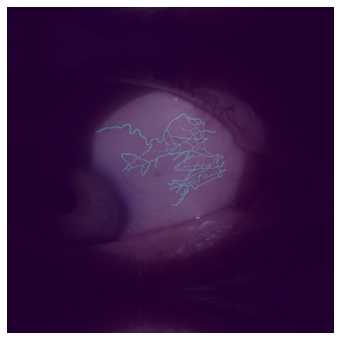

In [8]:
n=3
sample = dataset[n]
transformed = transforms['test'](**sample)
image, mask = transformed["image"], transformed["mask"]
image = 0.225 * image + 0.456
image = np.moveaxis(image.cpu().numpy(), 0, -1) 
mask = np.moveaxis(mask.cpu().numpy(), 0, -1)[:,:,1]   
    
plt.figure(figsize=(6, 6))
plt.imshow(image)
plt.imshow(mask, alpha=0.5)
plt.axis("off")

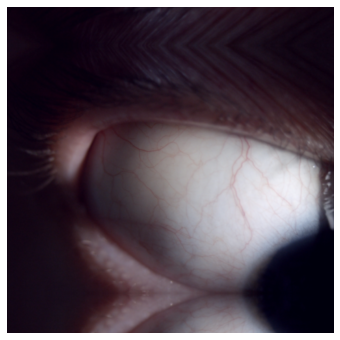

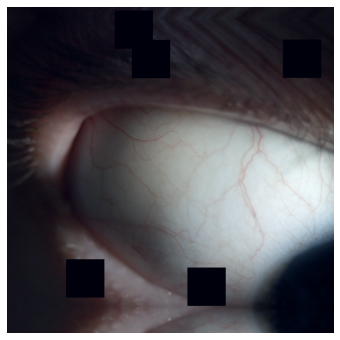

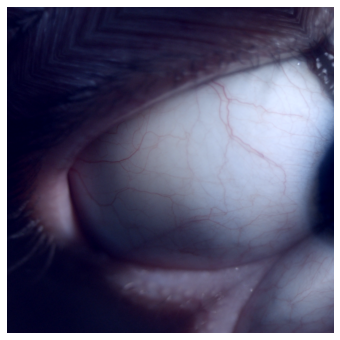

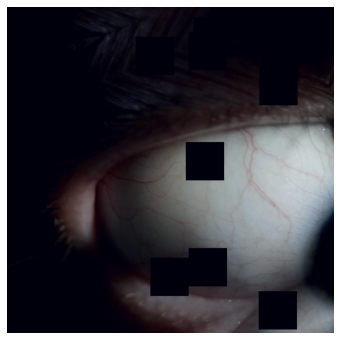

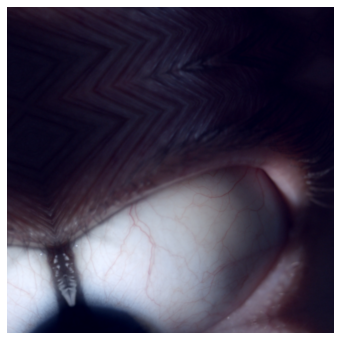

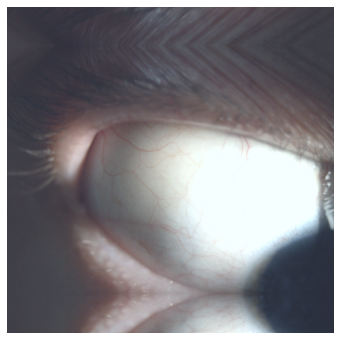

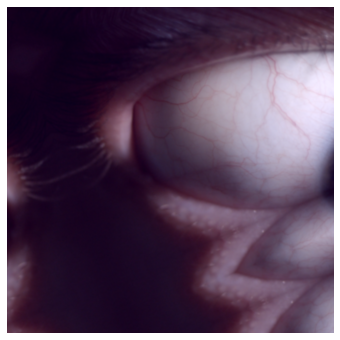

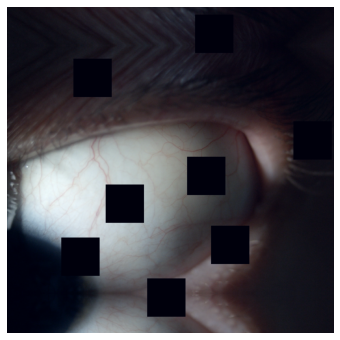

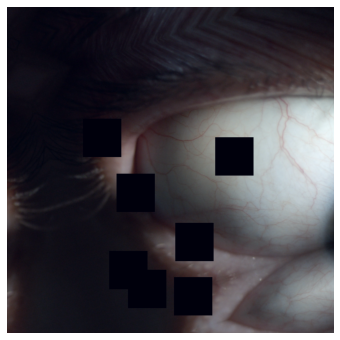

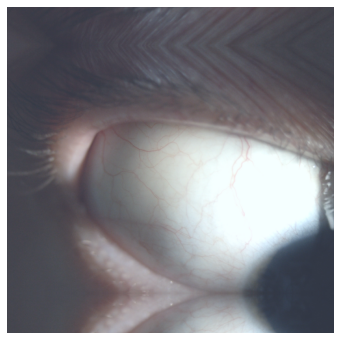

In [9]:
# Работа аугументации
n=0
for i in range(10):
    sample = dataset[n]
    transformed = transforms['train'](**sample)
    image, mask = transformed["image"], transformed["mask"]
    image = 0.225 * image + 0.456
    image = np.moveaxis(image.cpu().numpy(), 0, -1) 
    mask = np.moveaxis(mask.cpu().numpy(), 0, -1)[:,:,1]   
    
    plt.figure(figsize=(6, 6))
    plt.imshow(image)
    #plt.imshow(mask, alpha=0.5)
    plt.axis("off")

In [10]:
# Проверим состояние загруженного датасета
for msg in dataset.make_report():
    print(msg)
print(" Исключаем изоббражения без разметки ...")    
dataset.del_imges_without_mask()

for msg in dataset.make_report():
    print(msg)

Найдено 655 изображений
Найдено 5 изображений без разметки
 Исключаем изоббражения без разметки ...
Найдено 650 изображений
Для всех изображений есть файл разметки


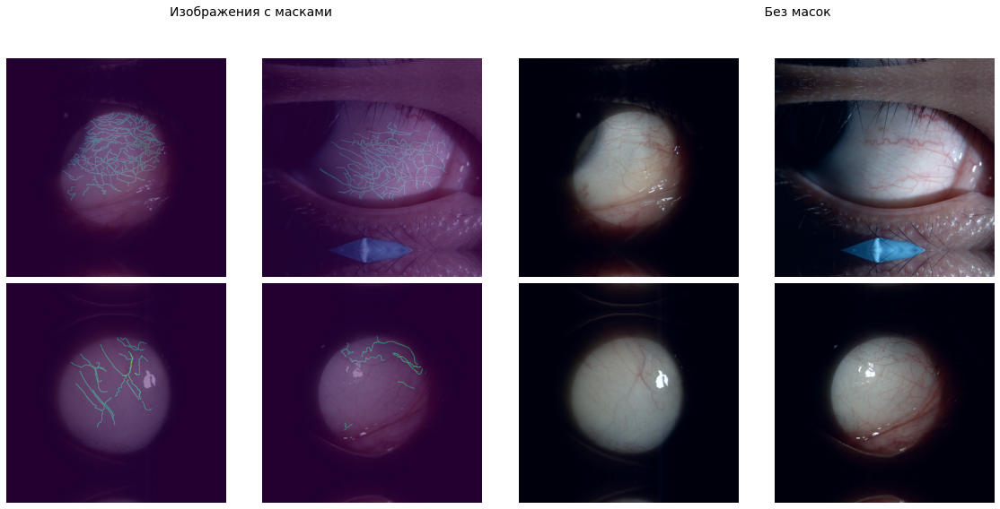

In [11]:
# Посмотрим на картинки из датасета

fig, axs = plt.subplots(2, 4, figsize=(16,8))
fig.suptitle(f'Изображения с масками {" "*105} Без масок', fontsize=14)

offset = 22
for i in range(4):
    sample = dataset[i+offset]
    transformed = transforms['test'](**sample)
    image, mask = transformed["image"], transformed["mask"]

    image = 0.225 * image + 0.456
    
    #image_with_mask = draw_segmentation_masks((image.cpu()).type(torch.uint8), mask.type(torch.bool))
    #image_with_mask = np.moveaxis(image_with_mask.cpu().numpy(), 0, -1)
    image = np.moveaxis(image.cpu().numpy(), 0, -1) 
    mask = np.moveaxis(mask.cpu().numpy(), 0, -1)[:,:,1]   
    
    axs[i // 2, (i % 2)].imshow(image)
    axs[i // 2, (i % 2)].imshow(mask, alpha=0.5)
    axs[i // 2, (i % 2)].axis('off')
       
    axs[i // 2, (i % 2)+2].imshow(image)
    axs[i // 2, (i % 2)+2].axis('off')

fig.tight_layout()
fig.subplots_adjust(top=0.88)

In [12]:
#dataset._image_files[skip_list]

#indexes = [2, 3, 5]
#for index in sorted(indexes, reverse=True):
#    del my_list[index]

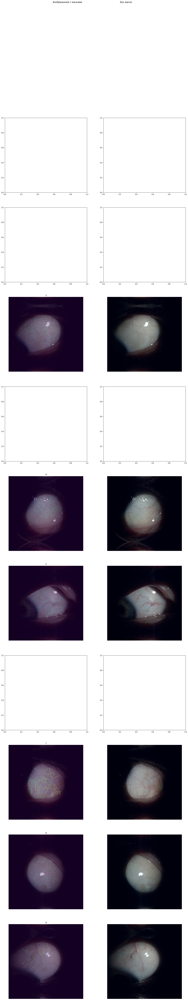

In [13]:
# Чистим датасет 

n = 10 #len(dataset)

fig, axs = plt.subplots(n, 2, figsize=(20,10*n))
fig.suptitle(f'Изображения с масками {" "*50} Без масок', fontsize=14)

skip_list = [1, 3, 6, 11, 18, 19, 21, 43, 44, 45, 47,  56, 59, 70, 72, 88, 92, 93, 89, 98, 
             102, 109, 110, 114, 117, 121, 122, 125, 144, 145, 149, 138, 150, 156, 162, 166, 167, 180, 182, 187, 188, 191, 
             200, 202, 209, 214, 215, 216, 221, 223, 224, 249, 250, 255, 257, 260, 265, 266, 280, 281, 285, 286, 290, 292, 293, 
             300, 304, 322, 326, 329, 332, 333,  369, 372, 379, 380,  
             401, 407, 413, 417, 421, 422,  425,427, 433, 435, 447, 448, 449,  465, 466, 472, 478, 474,  492, 497, 496, 499, 
             509, 514, 527, 528, 529, 537, 540, 541, 543, 544,  550, 560,
             555, 564, 572, 579, 581, 585,  604, 641, 640, 643, 644,
             517,
             25, 32, 36, 38, 46, 55, 61, 66, 71, 73,80, 84, 105, 127, 129, 132, 142, 143, 152, 153, 154, 160, 165, 170, 176, 194, 197,
             204, 210, 226, 233, 235, 238, 245, 246, 256, 258, 267, 279, 282, 284, 291, 305, 306, 321, 334, 343,
             351, 352, 360, 367, 373, 375, 399, 404, 415, 416, 129, 437, 438, 440, 446, 452, 468, 469, 471,
             473, 487, 488, 493, 505, 510, 511, 512, 521, 522, 559, 570, 574, 583, 595, 603, 616, 618, 621, 629, 632,
             
              0, 13, 14, 54, 62, 64, 67,74, 87, 108, 119, 128, 172, 177, 181, 190, 196, 207, 219, 232, 243, 
              253, 272, 273, 316, 327, 331, 370
            ]


offset = 0

for i in range(n):
    if i+offset in skip_list:
        continue
    sample = dataset[i+offset]
    #sample = dataset[first_check[i+offset]]
    transformed = transforms['test'](**sample)  #test
    image, mask = transformed["image"], transformed["mask"]

    image = 0.225 * image + 0.456
    
    #image_with_mask = draw_segmentation_masks((image.cpu() * 200).type(torch.uint8), mask.type(torch.bool))
    #image_with_mask = np.moveaxis(image_with_mask.cpu().numpy(), 0, -1)
    image = np.moveaxis(image.cpu().numpy(), 0, -1) 
    mask = np.moveaxis(mask.cpu().numpy(), 0, -1)[:,:,1] 
    
    axs[i , 0].imshow(image)
    axs[i , 0].imshow(mask, alpha=0.3)
    axs[i , 0].axis('off')
    axs[i , 0].set_title(str(i+offset))
    #axs[i , 0].set_title(first_check[i+offset])
       
    axs[i , 1].imshow(image)
    axs[i , 1].axis('off')

#fig.tight_layout()
#fig.subplots_adjust(top=0.88)



In [14]:
# Убиваем кривые экземляры из трейна
print(len(dataset._image_files))
for index in sorted(skip_list, reverse=True):
    del dataset._image_files[index]
    
print(len(dataset._image_files))

650
413


In [15]:
from os import listdir

print("Обучающей выборки " ,len(listdir("../input/dig-bf2022-train")) // 2)
print("Тестовой выборки " ,len(listdir("../input/digbf2022test/eye_test")))

Обучающей выборки  656
Тестовой выборки  307


In [16]:
# разделим датасет на тренировочный и валидационный, чтобы смотреть на качество
train_indices, test_indices = train_test_split(range(len(dataset)), test_size=0.2)


In [17]:
print(f"Разбиение на train/test : {len(train_indices)}/{len(test_indices)}")

Разбиение на train/test : 330/83


In [18]:
# Разбиваем объект датасета на тренировачный и валидационный
train_dataset = DatasetPart(dataset, train_indices, transform=transforms['train'])
valid_dataset = DatasetPart(dataset, test_indices, transform=transforms['test'])


In [19]:
train_loader = torch.utils.data.DataLoader(train_dataset, 4,
                                   num_workers=4,
                                   shuffle=True, drop_last=True)

valid_loader = torch.utils.data.DataLoader(valid_dataset, 4,
                                   num_workers=4,
                                   shuffle=True, drop_last=True)

In [20]:
next(iter(train_loader))['mask'].shape

torch.Size([4, 2, 1024, 1024])

## Вспомогательные функции

In [21]:
def plot_history(train_history, val_history, title='loss'):
    plt.figure()
    plt.title('{}'.format(title))
    
    
    points = np.array(val_history)
    steps = list(range(0, len(train_history) + 1, int(len(train_history) / len(val_history))))[1:]
    
    plt.plot(train_history, label='train', zorder=1)
    plt.plot(val_history, label='valid', zorder=2)
    #plt.scatter(steps, val_history, marker='+', s=180, c='orange', label='val', zorder=2)
    plt.xlabel('train steps')
    
    plt.legend(loc='best')
    plt.grid()

    plt.show()

# Класс тренировщика модели

In [22]:
from typing import Tuple, List, Callable, Iterator, Optional, Dict, Any
from collections import defaultdict

class UnetTrainer:
    """
    Класс, реализующий обучение модели
    """

    def __init__(self, model: nn.Module, optimizer: torch.optim.Optimizer,
                 criterion: Callable[[torch.Tensor, torch.Tensor], torch.Tensor],
                 device: str, metric_functions: List[Tuple[str, Callable]] = [],
                 epoch_number: int = 0,
                 lr_scheduler: Optional[Any] = None):
        self.model = model
        self.optimizer = optimizer  
        self.criterion = criterion
        self.lr_scheduler = lr_scheduler

        self.device = device

        self.metric_functions = metric_functions

        self.epoch_number = epoch_number

    @torch.no_grad()
    def evaluate_batch(self, val_iterator: Iterator, eval_on_n_batches: int) -> Optional[Dict[str, float]]:     
        predictions = []
        targets = []

        losses = []

        for real_batch_number in range(eval_on_n_batches):
            try:
                batch = next(val_iterator)

                xs = batch['image'].to(self.device)
                ys_true = batch['mask'].to(self.device)
            except StopIteration:
                if real_batch_number == 0:
                    return None
                else:
                    break
            ys_pred = self.model.eval()(xs)
            loss = self.criterion(ys_pred, ys_true)

            losses.append(loss.item())

            predictions.append(ys_pred.cpu())
            targets.append(ys_true.cpu())

        predictions = torch.cat(predictions, dim=0)
        targets = torch.cat(targets, dim=0)

        metrics = {'loss': np.mean(losses)}

        for metric_name, metric_fn in self.metric_functions:
            metrics[metric_name] = metric_fn(predictions, targets).item()

        return metrics

    @torch.no_grad()
    def evaluate(self, val_loader, eval_on_n_batches: int = 1) -> Dict[str, float]:
        """
        Вычисление метрик для эпохи
        """
        metrics_sum = defaultdict(float)
        num_batches = 0

        val_iterator = iter(val_loader)

        while True:
            batch_metrics = self.evaluate_batch(val_iterator, eval_on_n_batches)

            if batch_metrics is None:
                break

            for metric_name in batch_metrics:
                metrics_sum[metric_name] += batch_metrics[metric_name]

            num_batches += 1

        metrics = {}

        print("Valid metrics:")
        for metric_name in metrics_sum:
            metrics[metric_name] = metrics_sum[metric_name] / num_batches
            print(metric_name, metrics_sum[metric_name] / num_batches)

        return metrics

    def fit_batch(self, train_iterator: Iterator, update_every_n_batches: int) -> Optional[Dict[str, float]]:
        """
        Тренировка модели на одном батче
        """

        self.optimizer.zero_grad()

        predictions = []
        targets = []

        losses = []

        for real_batch_number in range(update_every_n_batches):
            try:
                batch = next(train_iterator)

                xs = batch['image'].to(self.device)
                ys_true = batch['mask'].to(self.device)
            except StopIteration:
                if real_batch_number == 0:
                    return None
                else:
                    break

            ys_pred = self.model.train()(xs)
            loss = self.criterion(ys_pred, ys_true)

            (loss / update_every_n_batches).backward()

            losses.append(loss.item())

            predictions.append(ys_pred.cpu())
            targets.append(ys_true.cpu())

        self.optimizer.step()

        predictions = torch.cat(predictions, dim=0)
        targets = torch.cat(targets, dim=0)

        metrics = {'loss': np.mean(losses)}

        for metric_name, metric_fn in self.metric_functions:
            metrics[metric_name] = metric_fn(predictions, targets).item()
            

        return metrics

    def fit_epoch(self, train_loader, update_every_n_batches: int = 1) -> Dict[str, float]:
        """
        Одна эпоха тренировки модели
        """

        metrics_sum = defaultdict(float)
        num_batches = 0

        train_iterator = iter(train_loader)

        while True:
            batch_metrics = self.fit_batch(train_iterator, update_every_n_batches)

            if batch_metrics is None:
                break

            for metric_name in batch_metrics:
                metrics_sum[metric_name] += batch_metrics[metric_name]

            num_batches += 1

        metrics = {}
        print("Train metrics")
        for metric_name in metrics_sum:
            metrics[metric_name] = metrics_sum[metric_name] / num_batches
            print(metric_name, metrics_sum[metric_name] / num_batches)
            
        
        

        return metrics

    def fit(self, train_loader, num_epochs: int,
            val_loader = None, update_every_n_batches: int = 1,
            ) -> Dict[str, np.ndarray]:
        """
        Метод, тренирующий модель и вычисляющий метрики для каждой эпохи
        """

        summary = defaultdict(list)
        best_dice = 0

        def save_metrics(metrics: Dict[str, float], postfix: str = '') -> None:
          # Сохранение метрик в summary
            nonlocal summary, self

            for metric in metrics:
                metric_name, metric_value = f'{metric}{postfix}', metrics[metric]

                summary[metric_name].append(metric_value)

        #for _ in tqdm(range(num_epochs - self.epoch_number), initial=self.epoch_number, total=num_epochs):
        for i in range(num_epochs): 
            self.epoch_number += 1
            
            print("\nEpoch: ", self.epoch_number)

            train_metrics = self.fit_epoch(train_loader, update_every_n_batches)

            with torch.no_grad():
                save_metrics(train_metrics, postfix='_train')

                if val_loader is not None:
                    test_metrics = self.evaluate(val_loader)
                    save_metrics(test_metrics, postfix='_test')

            if self.lr_scheduler is not None:
                self.lr_scheduler.step()
            
            #save best
            val_dice = test_metrics["dice"]
            
            if val_dice >= best_dice:
                print(f"Valid Score Improved ({best_dice:0.4f} ---> {val_dice:0.4f})")
                best_dice = val_dice
                torch.save(self.model.state_dict(), f"model_epoch_{self.epoch_number}.pth")
            if (self.epoch_number % 5 == 0):
                print(f"Save model_epoch_{self.epoch_number}.pth")
                torch.save(self.model.state_dict(), f"model_epoch_{self.epoch_number}.pth")

        summary = {metric: np.array(summary[metric]) for metric in summary}

        return summary


# Метрики

In [23]:
# F1-мера
class SoftDice:
    def __init__(self, epsilon=1e-8):
        self.epsilon = epsilon

    def __call__(self, predictions: List[Dict[str, torch.Tensor]],
                 targets: List[Dict[str, torch.Tensor]]) -> torch.Tensor:
        numerator = torch.sum(2 * predictions * targets)
        denominator = torch.sum(predictions + targets)
        return numerator / (denominator + self.epsilon)

class HardDice:
    def __init__(self, epsilon=1e-8):
        self.epsilon = epsilon    
        
    def __call__(self, predictions: List[Dict[str, torch.Tensor]],
                 targets: List[Dict[str, torch.Tensor]]) -> torch.Tensor:    
        threshold = 0.5

        predictions[predictions >= threshold] = 1.0
        predictions[predictions < threshold] = 0
        
        numerator = torch.sum(2 * predictions * targets)
        denominator = torch.sum(predictions + targets)
        return numerator / (denominator + self.epsilon)    

# Метрика полноты
class Recall:
    def __init__(self, epsilon=1e-8, b=1):
        self.epsilon = epsilon
        self.a = b*b

    def __call__(self, predictions: List[Dict[str, torch.Tensor]],
                 targets: List[Dict[str, torch.Tensor]]) -> torch.Tensor:
        numerator = torch.sum(predictions * targets)
        denominator = torch.sum(targets)

        return numerator / (denominator + self.epsilon)

# Метрика точности
class Accuracy:
    def __init__(self, epsilon=1e-8, b=1):
        self.epsilon = epsilon
        self.a = b*b

    def __call__(self, predictions: list, targets: list) -> torch.Tensor:
        numerator = torch.sum(targets)
        denominator = torch.sum(predictions * targets)

        return numerator / (denominator + self.epsilon)

def make_metrics():
    soft_dice = SoftDice()
    recall = Recall()
    accuracy = Accuracy()

    def exp_dice(pred, target):
        return soft_dice(torch.exp(pred[:, 1:]), target[:, 1:])

    def exp_accuracy(pred, target):
        return accuracy(torch.exp(pred[:, 1:]), target[:, 1:])

    def exp_recall(pred, target):
        return recall(torch.exp(pred[:, 1:]), target[:, 1:])
    
    def soft_dice_(pred, target):
        return soft_dice(pred[:, 1:], target[:, 1:])

    return [('exp_dice', exp_dice),
           # ('accuracy', exp_accuracy),
            ('recall', exp_recall),
           # ('soft_dice', soft_dice_)
            ]

def make_metrics_2():
    soft_dice = SoftDice()
    recall = Recall()
    hard_dice = HardDice()
    
    def softmax_dice(pred, target):
        return soft_dice(torch.softmax(pred.detach().cpu(), dim=1)[:, 1:], target[:, 1:].detach().cpu())

    def softmax_recall(pred, target):
        return recall(torch.softmax(pred.detach().cpu(), dim=1)[:, 1:], target[:, 1:].detach().cpu())
    
    def softmax_hard_dice(pred, target):
        return hard_dice(torch.softmax(pred.detach().cpu(), dim=1)[:, 1:], target[:, 1:].detach().cpu())

    return [('dice', softmax_dice),
            ('recall', softmax_recall),
            ('hard_dice', softmax_hard_dice),
            ]

## Модель

In [24]:
torch.cuda.empty_cache()

In [25]:
# Подргружаем модель и задаём функцию потерь
model = smp.Unet('resnet50', activation=None, classes=2).cuda()

#model = smp.UnetPlusPlus('efficientnet-b5', activation=None, classes=2).cuda()

#efficientnet-b5


Downloading: "https://download.pytorch.org/models/resnet50-19c8e357.pth" to /root/.cache/torch/hub/checkpoints/resnet50-19c8e357.pth


  0%|          | 0.00/97.8M [00:00<?, ?B/s]

In [26]:
model.load_state_dict(torch.load("../input/dbf-model-ch24/model_epoch_24.pth"), strict=False)

<All keys matched successfully>

In [27]:

DiceLoss    = smp.losses.DiceLoss(mode='multilabel')
BCELoss     = smp.losses.SoftBCEWithLogitsLoss()
TverskyLoss = smp.losses.TverskyLoss(mode='multilabel', log_loss=False, alpha=0.6, beta=0.5, from_logits=True)


def make_criterion(y_pred, y_true):
    return 0.5*BCELoss(y_pred, y_true) + 0.5*TverskyLoss(y_pred[:, 1:], y_true[:, 1:])

criterion = make_criterion

In [28]:
optimizer = torch.optim.Adam(model.parameters(), 0.0002, betas=(0.9, 0.999), 
                 eps=1e-08, weight_decay=0)

In [29]:
# Обучаем модель

trainer = UnetTrainer(model, optimizer, criterion, 'cuda', metric_functions=make_metrics_2())
summary = trainer.fit(train_loader, 30, val_loader=valid_loader)



#model.load_state_dict(torch.load(PATH), strict=False)


Epoch:  1
Train metrics
loss 0.21751271460841343
dice 0.6325264900195889
recall 0.6194497495889664
hard_dice 0.6390758258540455
Valid metrics:
loss 0.1905249021947384
dice 0.6785010039806366
recall 0.7259954124689102
hard_dice 0.683964166045189
Valid Score Improved (0.0000 ---> 0.6785)

Epoch:  2
Train metrics
loss 0.21443905699543836
dice 0.6333780673945822
recall 0.6163285567266185
hard_dice 0.6395496769649226
Valid metrics:
loss 0.19510428607463837
dice 0.6695270091295242
recall 0.6947673261165619
hard_dice 0.6742618829011917

Epoch:  3
Train metrics
loss 0.21258399344798995
dice 0.63913071882434
recall 0.6305656814720573
hard_dice 0.6444900588291448
Valid metrics:
loss 0.19197574332356454
dice 0.6746371418237687
recall 0.6970831692218781
hard_dice 0.679329252243042

Epoch:  4
Train metrics
loss 0.21724403068059828
dice 0.6285699635017209
recall 0.619575683300088
hard_dice 0.633751416351737
Valid metrics:
loss 0.19201560243964194
dice 0.668527552485466
recall 0.6577860444784165
har

In [30]:
best_bach = np.argmax(summary['dice_test'])
print(best_bach+1, summary['dice_test'][best_bach])

30 0.6816594541072846


In [31]:
#best_bach = 10
model.load_state_dict(torch.load(f"./model_epoch_{best_bach+1}.pth"), strict=False)
#model.load_state_dict(torch.load(f"../input/nodel-from-prev-1/model_epoch_11.pth"), strict=False)

<All keys matched successfully>

## Посмотрим метрики обученной модели на валидационном датасете

In [32]:
summary

{'loss_train': array([0.21751271, 0.21443906, 0.21258399, 0.21724403, 0.21137314,
        0.20968178, 0.21118043, 0.20959764, 0.21161864, 0.2100545 ,
        0.20800085, 0.21064025, 0.20680241, 0.20575547, 0.20662585,
        0.20724985, 0.20467252, 0.20619602, 0.20602069, 0.20546786,
        0.20608357, 0.20366324, 0.20389296, 0.20160464, 0.20076169,
        0.20149363, 0.19830214, 0.19959593, 0.20126692, 0.20080624]),
 'dice_train': array([0.63252649, 0.63337807, 0.63913072, 0.62856996, 0.64152511,
        0.64101985, 0.63895022, 0.64215474, 0.63597986, 0.64233621,
        0.64440222, 0.64020293, 0.6462687 , 0.64880911, 0.64805062,
        0.64880731, 0.64830073, 0.6487263 , 0.65013477, 0.64982863,
        0.64643069, 0.65062959, 0.65100911, 0.65416795, 0.65852467,
        0.65637697, 0.66128118, 0.65877622, 0.65600509, 0.65877901]),
 'recall_train': array([0.61944975, 0.61632856, 0.63056568, 0.61957568, 0.63137797,
        0.63060556, 0.62782895, 0.63519592, 0.62393467, 0.63670448,


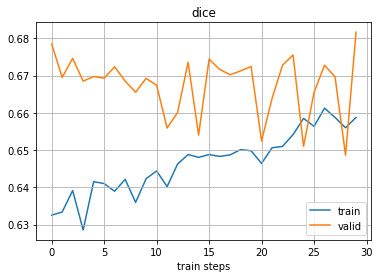

In [33]:
# Функция потерь
plot_history(summary['dice_train'], summary['dice_test'], "dice")

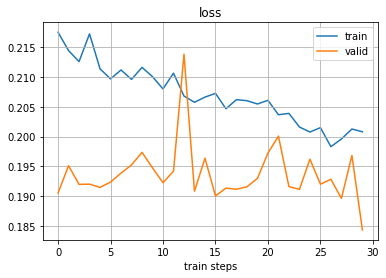

In [34]:
# Функция потерь
plot_history(summary['loss_train'], summary['loss_test'])

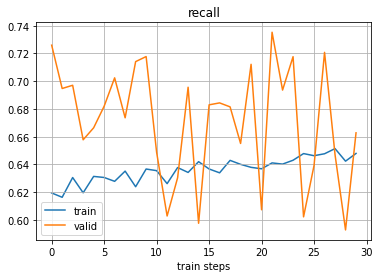

In [35]:
# Полнота
plot_history(summary['recall_train'], summary['recall_test'], "recall")

In [36]:
'''
val_len = len(valid_dataset)
sd = SoftDice()
thresholds = [0.01, 0.3, 0.4, 0.5, 0.6, 0.99]
dices = [0 for item in thresholds]
for i, sample in enumerate(valid_dataset):
    image = sample['image'].to("cuda")
    true_mask = sample['mask']

    prediction = model.eval()(image.unsqueeze(dim=0))

    
    pred = prediction[0].cpu().detach()
    #print(pred)
    mask_ = torch.softmax(pred, axis=0)
    #print(mask_)
    #mask=torch.max(mask, axis=0).indices.type(torch.uint8)
    for k, threshold in enumerate(thresholds):
        mask = mask_
        mask[mask>threshold] = 1
        mask[mask<threshold] = 0
        
        cur_sd = sd(mask[1], true_mask[1])
        dices[k] += cur_sd.item()
    
    break
    
print(dices)    
dices = [item/val_len for item in dices]
dices

'''

'\nval_len = len(valid_dataset)\nsd = SoftDice()\nthresholds = [0.01, 0.3, 0.4, 0.5, 0.6, 0.99]\ndices = [0 for item in thresholds]\nfor i, sample in enumerate(valid_dataset):\n    image = sample[\'image\'].to("cuda")\n    true_mask = sample[\'mask\']\n\n    prediction = model.eval()(image.unsqueeze(dim=0))\n\n    \n    pred = prediction[0].cpu().detach()\n    #print(pred)\n    mask_ = torch.softmax(pred, axis=0)\n    #print(mask_)\n    #mask=torch.max(mask, axis=0).indices.type(torch.uint8)\n    for k, threshold in enumerate(thresholds):\n        mask = mask_\n        mask[mask>threshold] = 1\n        mask[mask<threshold] = 0\n        \n        cur_sd = sd(mask[1], true_mask[1])\n        dices[k] += cur_sd.item()\n    \n    break\n    \nprint(dices)    \ndices = [item/val_len for item in dices]\ndices\n\n'

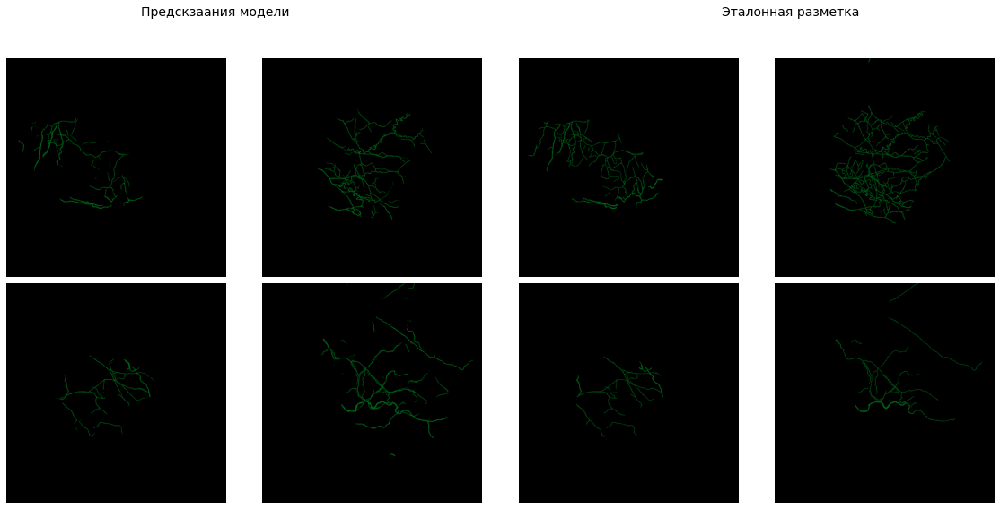

In [37]:
# Посмотрим на картинки предсказаний

fig, axs = plt.subplots(2, 4, figsize=(16,8))
fig.suptitle(f'Предскзаания модели {" "*105} Эталонная разметка', fontsize=14)

for i, sample in zip(range(4), valid_dataset):
    image = sample['image'].to("cuda")
    true_mask = sample['mask'].to("cuda")

    prediction = model.eval()(image.unsqueeze(dim=0))
    
    image = 0.225 * image + 0.456

    image = (image.cpu()).type(torch.uint8)
    pred_ask = (torch.exp(prediction[0]) > 0.5).cpu()

    image_with_mask = draw_segmentation_masks(image, pred_ask)
    image_with_mask = np.moveaxis(image_with_mask.cpu().numpy(), 0, -1)

    axs[i // 2, (i % 2)].imshow(image_with_mask)
    axs[i // 2, (i % 2)].axis('off')


    image_with_mask = draw_segmentation_masks(image, true_mask.type(torch.bool))
    image_with_mask = np.moveaxis(image_with_mask.cpu().numpy(), 0, -1)
    axs[i // 2, (i % 2)+2].imshow(image_with_mask)
    axs[i // 2, (i % 2)+2].axis('off')


fig.tight_layout()
fig.subplots_adjust(top=0.88)

# Тестовый датасет

In [38]:
# Инициализируем датасет
test_dataset = EyeDataset("../input/dogbf2022test-v2/eye_test", transform=transforms['test'], is_test=True)

for msg in test_dataset.make_report():
    print(msg)
    
#test_loader = torch.utils.data.DataLoader(test_dataset, 1,
#                                   num_workers=4,
#                                   shuffle=True, drop_last=True)

Найдено 301 изображений
Найдено 301 изображений без разметки


In [39]:
# Посмотрим на картинки из теста
'''
fig, axs = plt.subplots(2, 2, figsize=(8,8))
fig.suptitle(f'Предскзаания модели', fontsize=14)

for i, sample in zip(range(4), test_dataset):
    image = sample['image'].to("cuda")
    true_mask = sample['mask'].to("cuda")

    prediction = model.eval()(image.unsqueeze(dim=0))
    
    image = 0.225 * image + 0.456
    
    image_ = 0.225 * image + 0.456

    image = (image.cpu()).type(torch.uint8)
    pred_ask = (torch.exp(prediction[0]) > 0.5).cpu()

    image_with_mask = draw_segmentation_masks(image, pred_ask)
    image_with_mask = np.moveaxis(image_with_mask.cpu().detach().numpy(), 0, -1)
    image_ = np.moveaxis(image_.cpu().detach().numpy(), 0, -1)
    pred_mask = np.moveaxis(pred_ask.cpu().detach().numpy(), 0, -1)[:,:,1]

    axs[i // 2, (i % 2)].imshow(image_)
    axs[i // 2, (i % 2)].imshow(pred_mask, alpha=0.5)
    
    axs[i // 2, (i % 2)].axis('off')


    #image_with_mask = draw_segmentation_masks(image, true_mask.type(torch.bool))
    #image_with_mask = np.moveaxis(image_with_mask.cpu().numpy(), 0, -1)
    #axs[i // 2, (i % 2)+2].imshow(image_with_mask)
    #axs[i // 2, (i % 2)+2].axis('off')


fig.tight_layout()
fig.subplots_adjust(top=0.88)
'''

'\nfig, axs = plt.subplots(2, 2, figsize=(8,8))\nfig.suptitle(f\'Предскзаания модели\', fontsize=14)\n\nfor i, sample in zip(range(4), test_dataset):\n    image = sample[\'image\'].to("cuda")\n    true_mask = sample[\'mask\'].to("cuda")\n\n    prediction = model.eval()(image.unsqueeze(dim=0))\n    \n    image = 0.225 * image + 0.456\n    \n    image_ = 0.225 * image + 0.456\n\n    image = (image.cpu()).type(torch.uint8)\n    pred_ask = (torch.exp(prediction[0]) > 0.5).cpu()\n\n    image_with_mask = draw_segmentation_masks(image, pred_ask)\n    image_with_mask = np.moveaxis(image_with_mask.cpu().detach().numpy(), 0, -1)\n    image_ = np.moveaxis(image_.cpu().detach().numpy(), 0, -1)\n    pred_mask = np.moveaxis(pred_ask.cpu().detach().numpy(), 0, -1)[:,:,1]\n\n    axs[i // 2, (i % 2)].imshow(image_)\n    axs[i // 2, (i % 2)].imshow(pred_mask, alpha=0.5)\n    \n    axs[i // 2, (i % 2)].axis(\'off\')\n\n\n    #image_with_mask = draw_segmentation_masks(image, true_mask.type(torch.bool))\n 

In [40]:
#model.cpu()

In [41]:
for i, sample in zip(range(2), test_dataset):
    image = sample['image'].to("cuda")
    true_mask = sample['mask'].to("cuda")

    prediction = model.eval()(image.unsqueeze(dim=0))

    #image = (image.cpu() * 255).type(torch.uint8)
    #pred_mask = (torch.exp(prediction[0]) > 0.5).cpu()
    
    break

In [42]:

from torchvision import transforms
from torchvision.io import write_png

def reshape_mask(mask, test_height, test_width):
    transform_to_png = transforms.Compose([
            transforms.Resize(test_width),
            transforms.CenterCrop((test_height, test_width)),
        ])
    return transform_to_png(mask)

def mask_to_png(mask, name="out.png", threshold=0.5):
    mask=torch.softmax(mask, axis=0)[1]
    
    #mask=torch.max(mask, axis=0).indices.type(torch.uint8)
    mask[mask>threshold] = 255
    write_png(mask.unsqueeze(0).type(torch.uint8), name)
    
#reshaped_mask = reshape_mask(prediction[0].cpu(), test_height, test_width )
#mask_to_png(reshaped_mask, "test2.png")

In [43]:
PRED_MASK_DIR = "./mask_preds/"
!mkdir mask_preds

In [44]:
for file_name, sample in tqdm(zip(test_dataset._image_files, test_dataset)):
    
    test_img = cv2.imread(file_name)
    #print(file_name)
    #print(PRED_MASK_DIR+file_name.split("/")[-1])
    test_height, test_width, test_channels  = test_img.shape
    
    image = sample['image'].to("cuda")
    true_mask = sample['mask'].to("cuda")

    prediction = model.eval()(image.unsqueeze(dim=0))
    
    reshaped_mask = reshape_mask(prediction[0].cpu().detach(), test_height, test_width )
    mask_to_png(reshaped_mask, PRED_MASK_DIR+file_name.split("/")[-1])
    
    

301it [02:22,  2.11it/s]


In [45]:
import zipfile
import os

added_list = ['1051.png', '862.png', '929.png', '974.png']
    
def zipdir(path, ziph):
    # ziph is zipfile handle
    for root, dirs, files in os.walk(path):
        print(root)
        print(len(files))
        for file in files:
            ziph.write(os.path.join(root, file), file)
            
            
# v.8 solution_30.zip Score = 0.538726 dice = 0.5726
# v.9 solution_40.zip Score = 0.540441 dice = 0.6037
# v2.1 solution_100.zip Score = 0.541517 dice = 0.6117
# v2.2 solution_120.zip Score = 0.543094 dice = 0.6019
# v2.3 solution_140.zip Score = 0.547475 dice = 0.6302


with zipfile.ZipFile('solution_2209_1200.zip', 'w', zipfile.ZIP_DEFLATED) as zipf:
    zipdir(PRED_MASK_DIR, zipf)

./mask_preds/
301


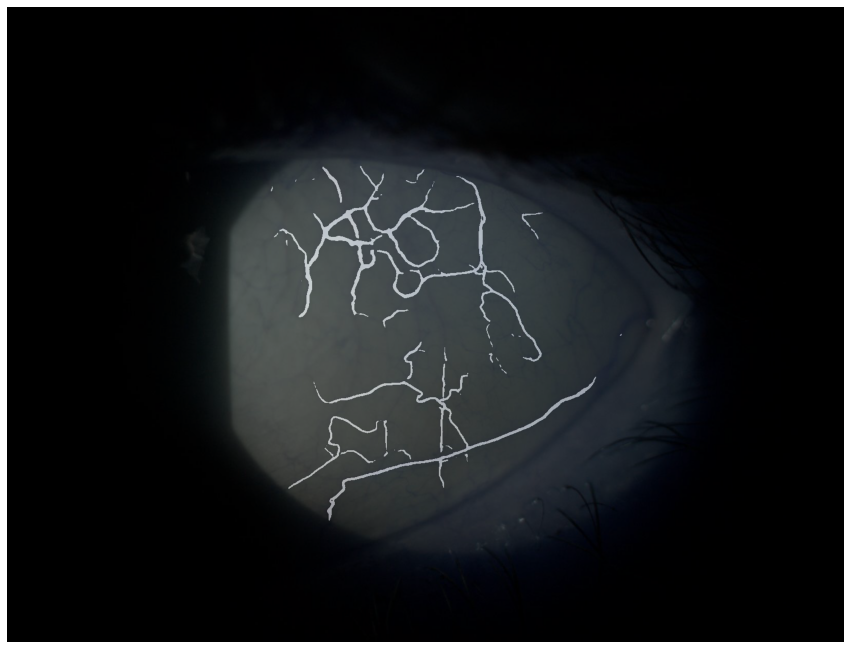

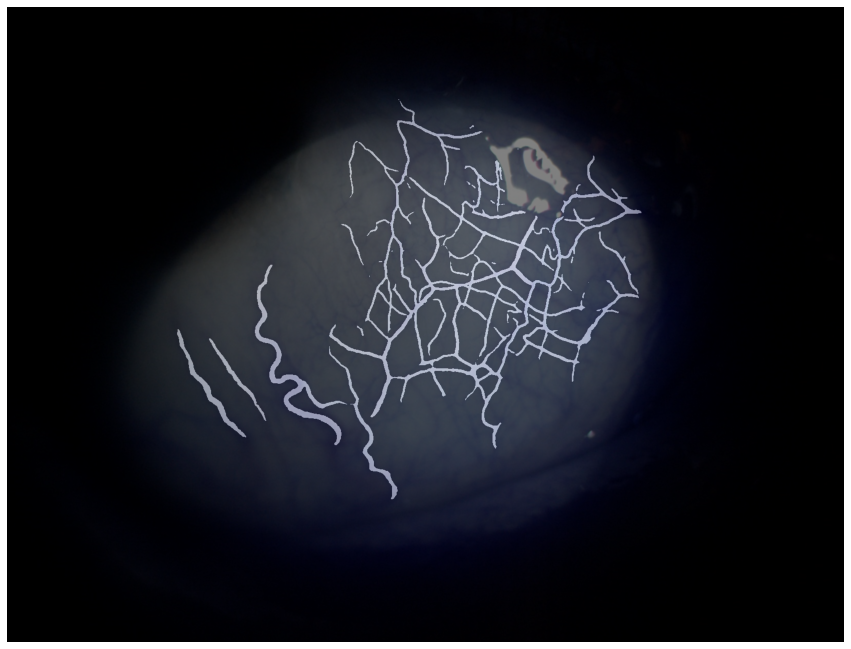

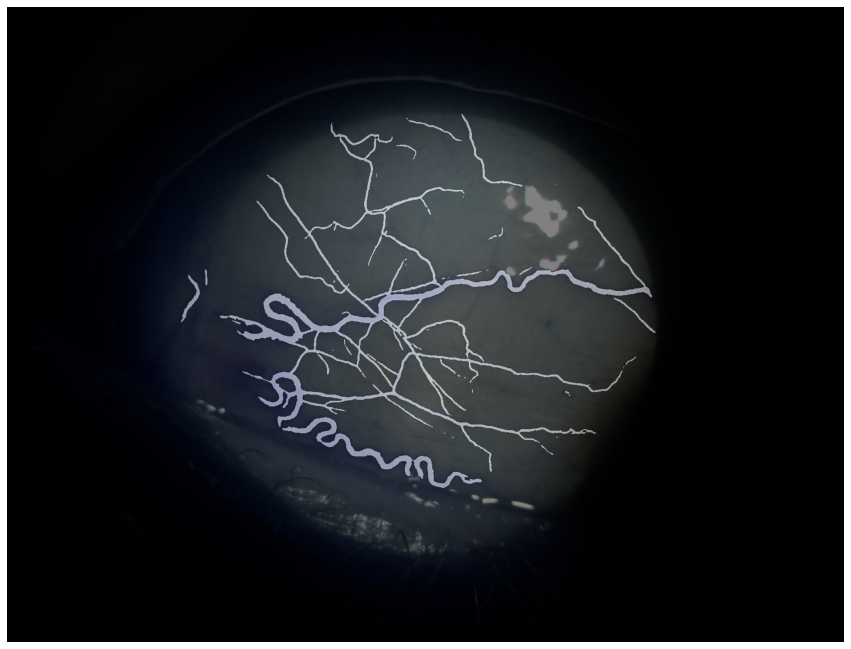

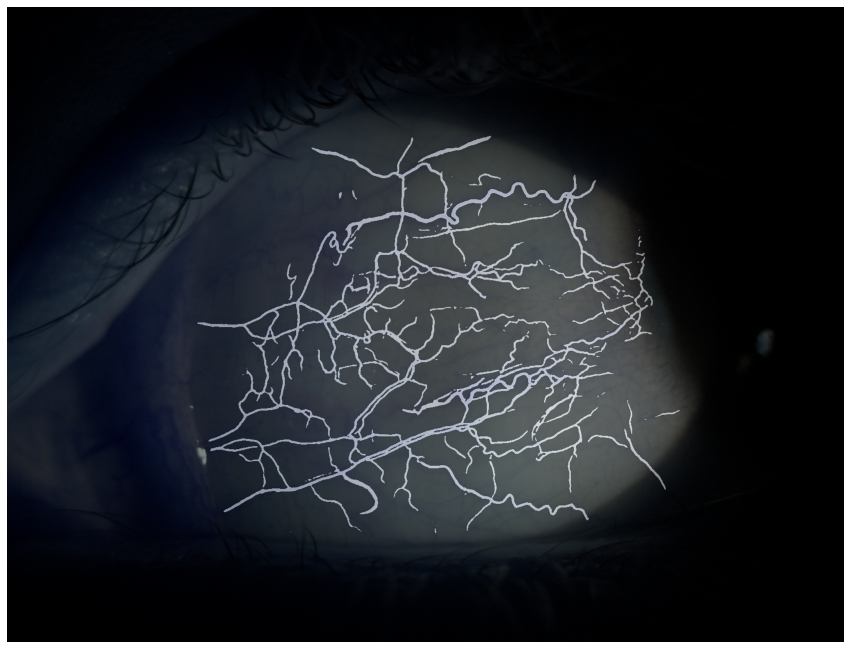

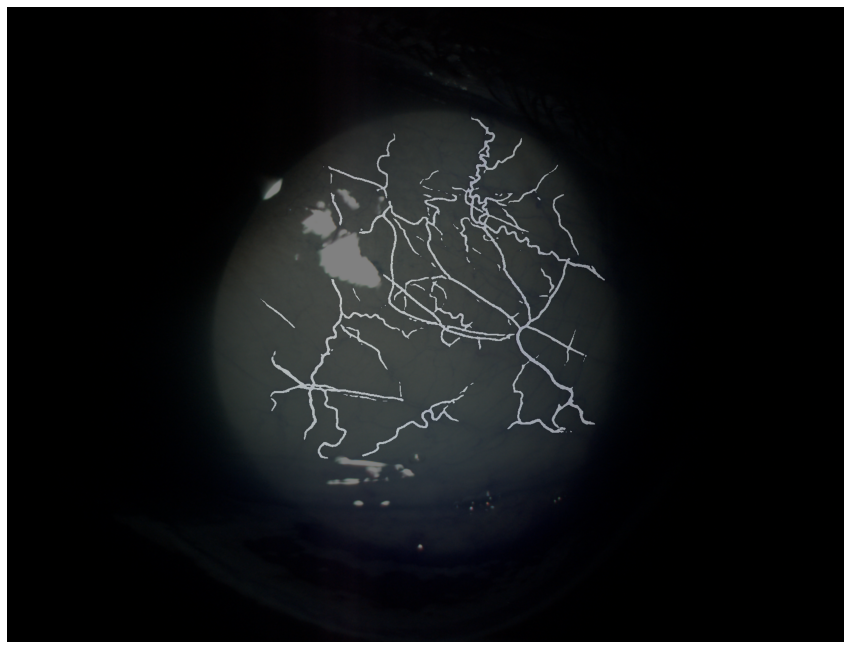

...

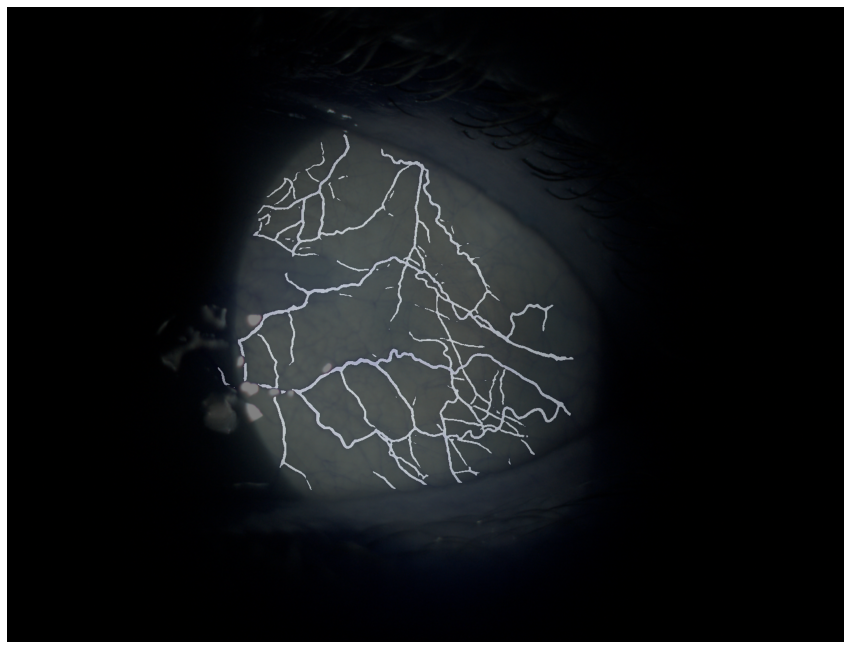

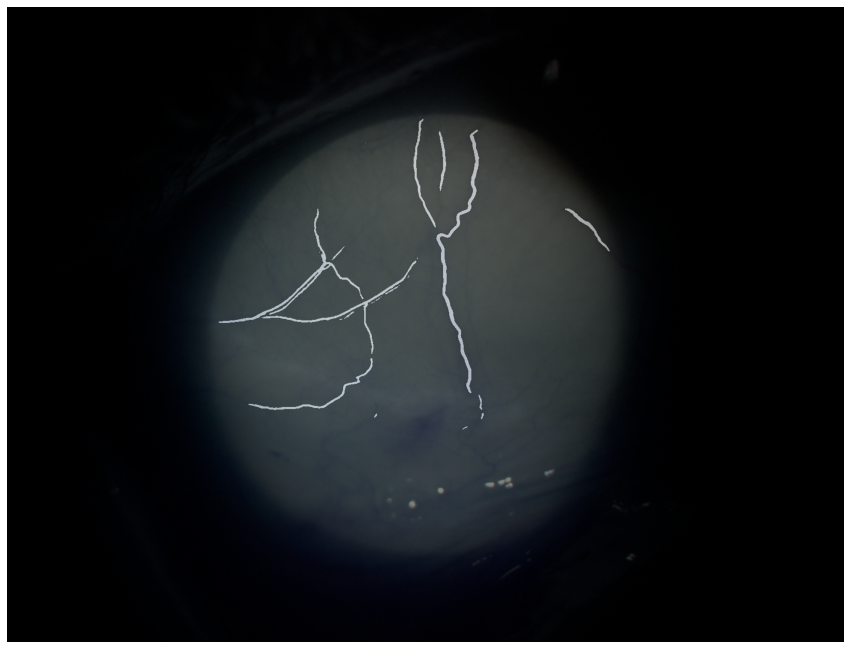

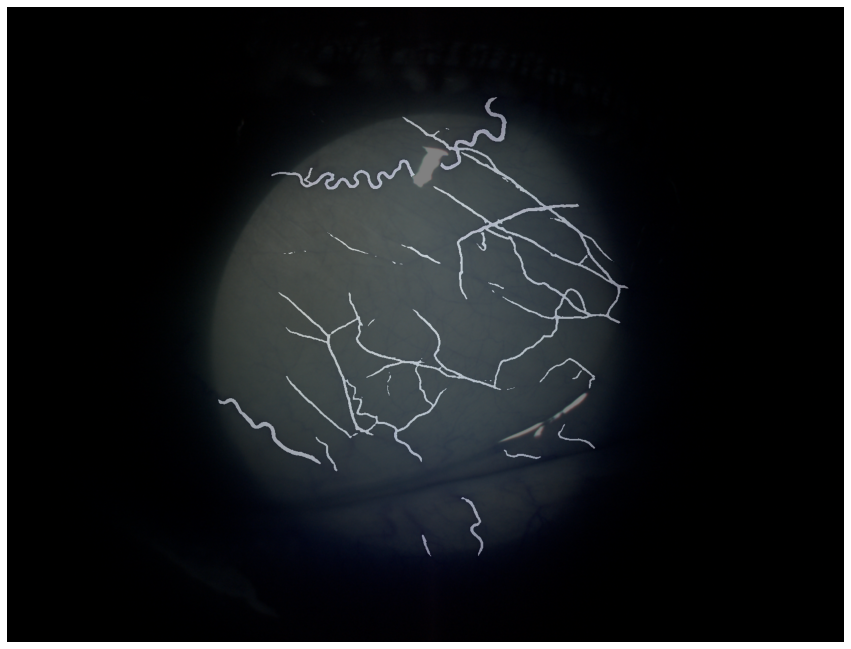

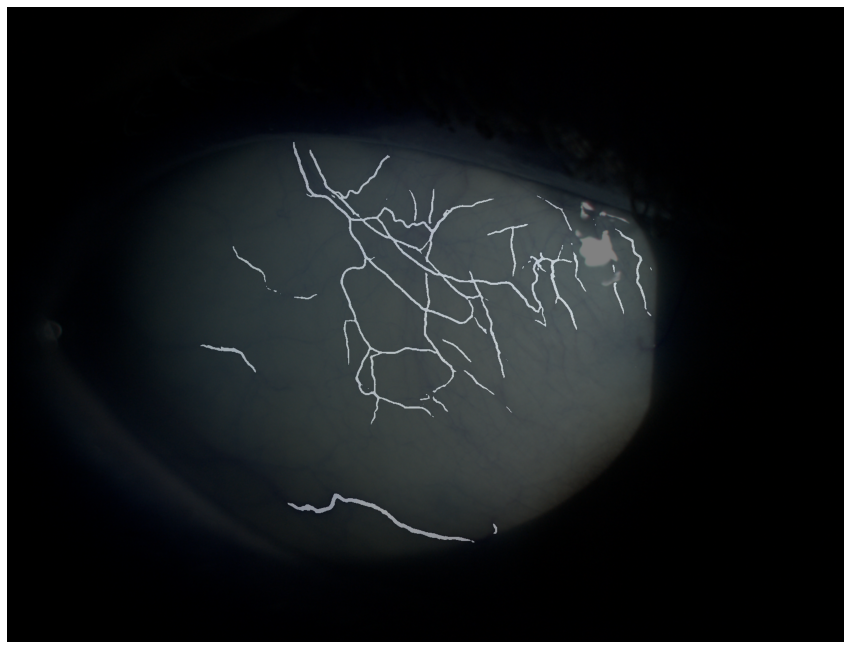

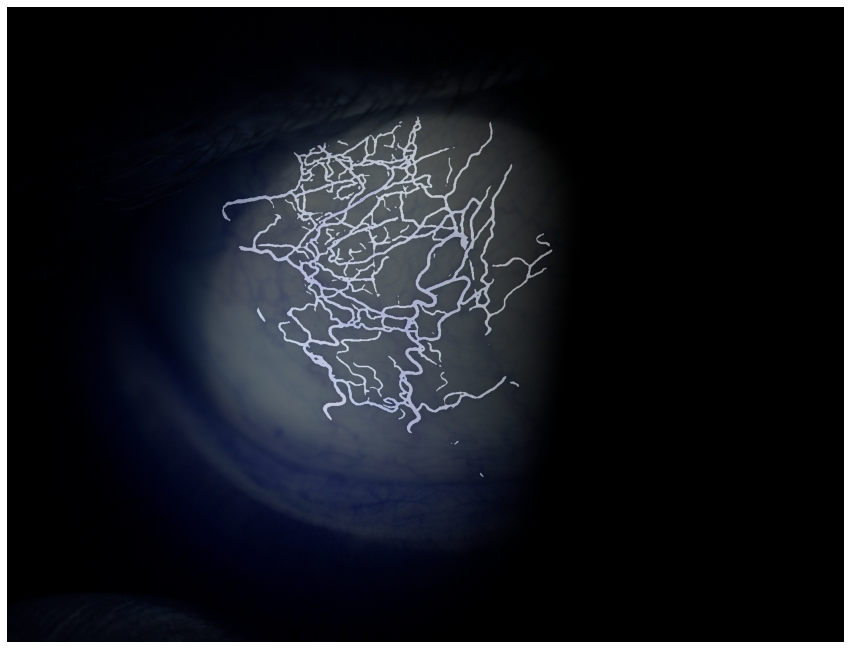

In [46]:
# Проверим правильность положения предсказанной маски на исходном изображении

for i in range(20):
    img = cv2.imread(str(test_dataset._image_files[i]), cv2.IMREAD_COLOR)
    mask_pth = PRED_MASK_DIR+str(test_dataset._image_files[i]).split("/")[-1]
    mask = cv2.imread(mask_pth, cv2.IMREAD_COLOR)

    plt.figure(figsize=(15, 15))
    plt.imshow(img)
    plt.imshow(mask, alpha=0.5)
    plt.axis("off")